In [1]:
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

import numpy as np
import pandas as pd
import math

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker # format the range
plt.rcParams.update({'font.size': 20}) 

from sklearn.model_selection import GridSearchCV

import re 

In [2]:
# load data
train_df = pd.read_csv('/kaggle/input/playground-series-s4e9/train.csv', index_col='id')
test_df = pd.read_csv('/kaggle/input/playground-series-s4e9/test.csv', index_col='id')

sumbission_df = pd.read_csv('/kaggle/input/playground-series-s4e9/sample_submission.csv')


# Drop duplicates
train_df = train_df.drop_duplicates()

X = train_df.drop('price', axis=1)
y = train_df[['price']]
X_test = test_df

In [3]:
train_df.head()

,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,price
id,,,,,,,,,,,,
0,MINI,Cooper S Base,2007,213000,Gasoline,172.0HP 1.6L 4 Cylinder Engine Gasoline Fuel,A/T,Yellow,Gray,None reported,Yes,4200
1,Lincoln,LS V8,2002,143250,Gasoline,252.0HP 3.9L 8 Cylinder Engine Gasoline Fuel,A/T,Silver,Beige,At least 1 accident or damage reported,Yes,4999
2,Chevrolet,Silverado 2500 LT,2002,136731,E85 Flex Fuel,320.0HP 5.3L 8 Cylinder Engine Flex Fuel Capab...,A/T,Blue,Gray,None reported,Yes,13900
3,Genesis,G90 5.0 Ultimate,2017,19500,Gasoline,420.0HP 5.0L 8 Cylinder Engine Gasoline Fuel,Transmission w/Dual Shift Mode,Black,Black,None reported,Yes,45000
4,Mercedes-Benz,Metris Base,2021,7388,Gasoline,208.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,7-Speed A/T,Black,Beige,None reported,Yes,97500


In [4]:
train_df.isna().sum() 

brand               0
model               0
model_year          0
milage              0
fuel_type        5083
engine              0
transmission        0
ext_col             0
int_col             0
accident         2452
clean_title     21419
price               0
dtype: int64

In [5]:
clean_title = X['clean_title']
clean_title = clean_title.replace([np.nan], 'Unknown')
print(clean_title.value_counts()) # ~13% Missing

clean_title
Yes        167114
Unknown     21419
Name: count, dtype: int64


In [6]:
fuel_types = X['fuel_type'].unique()
fuel_types

array(['Gasoline', 'E85 Flex Fuel', nan, 'Hybrid', 'Diesel',
       'Plug-In Hybrid', '–', 'not supported'], dtype=object)

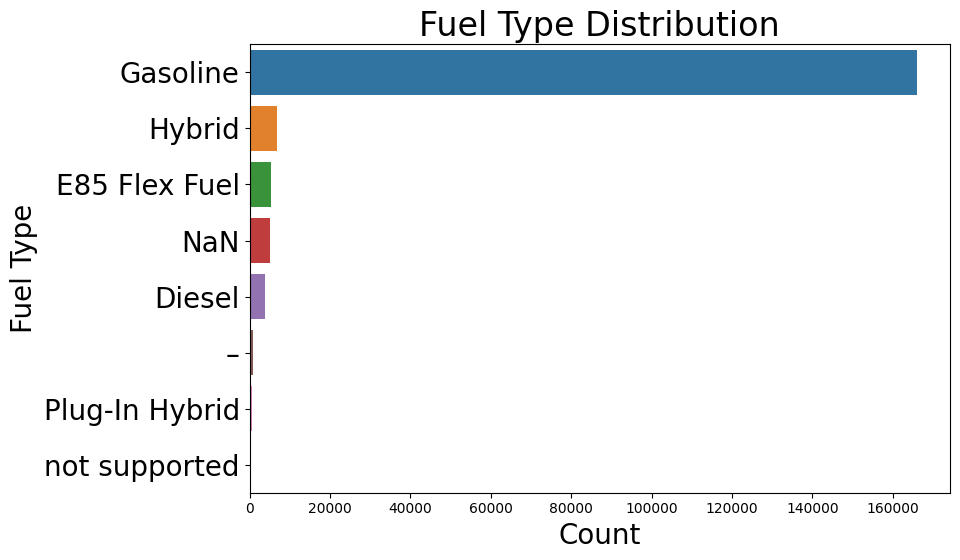

In [7]:
# Fuel Distribution

fuel_distribution = X['fuel_type']

fuel_distribution = fuel_distribution.replace([np.nan], 'NaN')

# Create a plot
plt.figure(figsize=(10, 6))
sns.countplot(y=fuel_distribution, order=fuel_distribution.value_counts().index)

# Add labels
plt.title('Fuel Type Distribution')
plt.xlabel('Count')
plt.tick_params(axis='x', which='major', labelsize=10)
plt.ylabel('Fuel Type')

plt.tight_layout()
plt.show()

In [8]:
# I added the fuel types one by one
# Could not automate it

engines_missing_fuel_types = X[X['fuel_type'].isna()][['fuel_type', 'engine']]

engine_types = ['gasoline', 'flex', 'hybrid', 'diesel', # Original  
              # What I found 
              'electric', 'standard', 'dohc', 'sohc', 'tfsi', 'fr 70kw', 'v8', '120 ah', 'liter'] 


for fuel_type, engine in engines_missing_fuel_types.values:
    engine_type_found = False
    for engine_type in engine_types:
        if engine_type in engine.lower():
            engine_type_found = True
                        
    if not engine_type_found:
        print(engine)

In [9]:
accident = X['accident']
accident.unique()

array(['None reported', 'At least 1 accident or damage reported', nan],
      dtype=object)

In [10]:
accident = accident.replace([np.nan], 'Unknown')
accident.value_counts()

accident
None reported                             144514
At least 1 accident or damage reported     41567
Unknown                                     2452
Name: count, dtype: int64

In [11]:
# Clean title: NaN -> 'Unkown'
X['clean_title'] = X['clean_title'].replace([np.nan], 'Unknown')
X_test['clean_title'] = X_test['clean_title'].replace([np.nan], 'Unknown')

# Fuel_type: '-', 'not supported', nan -> 'Unknown'
X['fuel_type'] = X['fuel_type'].replace(['not supported', np.nan, '–'], 'Unknown')
X_test['fuel_type'] = X_test['fuel_type'].replace(['not supported', np.nan, '–'], 'Unknown')

# Accident: np.NaN with string Unknown
X['accident'] = X['accident'].replace([np.nan], 'Unknown')
X_test['accident'] = X_test['accident'].replace([np.nan], 'Unknown')

In [12]:
# Missing Data Handled
assert sum(X.isna().sum()) == 0, "Missing Data not handled well for training data" 
assert sum(X_test.isna().sum()) == 0, "Missing Data not handled properly for test"

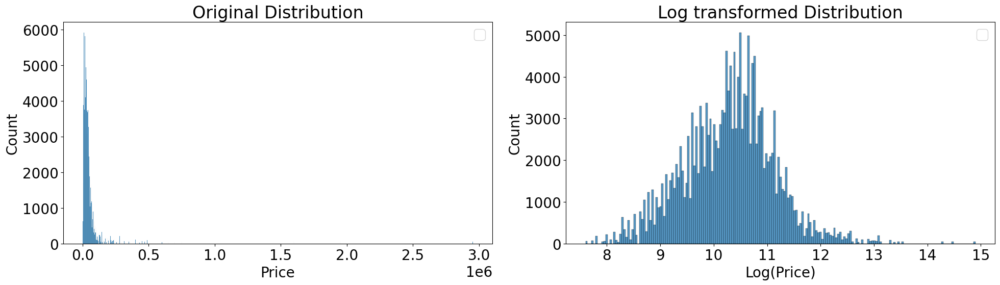

In [13]:
price = y['price']
price_log = price.copy().map(lambda x: math.log(x))


fig, ax = plt.subplots(1, 2, figsize=(20, 6))
sns.histplot(x=price, ax=ax[0])
sns.histplot(x=price_log, ax=ax[1]) # Hey-Ho we got a nice Gaussian Distribution =)

# Custom labels for the first subplot
ax[0].set_xlabel('Price')
ax[0].set_ylabel('Count')
ax[0].set_title('Original Distribution')

# Custom labels for the second subplot
ax[1].set_xlabel('Log(Price)')
ax[1].set_ylabel('Count')
ax[1].set_title('Log transformed Distribution')

ax[0].legend()
ax[1].legend()

plt.tight_layout()
plt.show()

In [14]:
# Create a new target df to store log(price)
y_log = y.copy()
y_log['price'] = np.log(y['price'])

# Index
y_log.index = y.index

In [15]:
# utility function
def classify_features(df):
    categorical_features = []
    non_categorical_features = []
    discrete_features = []
    continuous_features = []
    for column in df.columns:
        if df[column].dtype == 'object':
            if df[column].nunique() <= 20:
                categorical_features.append(column)
            else:
                non_categorical_features.append(column)
        elif df[column].dtype in ['int64', 'float64']:
            if df[column].nunique() <= 10:
                discrete_features.append(column)
            else:
                continuous_features.append(column)
                
    return categorical_features, non_categorical_features, discrete_features, continuous_features

In [16]:
categorical, non_categorical, discrete, continuous = classify_features(X)

In [17]:
print(f"{'Categorical Features:':<{30}} {categorical}")
print(f"{'Non-Categorical Features:':<{30}} {non_categorical}")
print(f"{'Discrete Features:':<{30}} {discrete}")
print(f"{'Continuous Features:':<{30}} {continuous}")

Categorical Features:          ['fuel_type', 'accident', 'clean_title']
Non-Categorical Features:      ['brand', 'model', 'engine', 'transmission', 'ext_col', 'int_col']
Discrete Features:             []
Continuous Features:           ['model_year', 'milage']


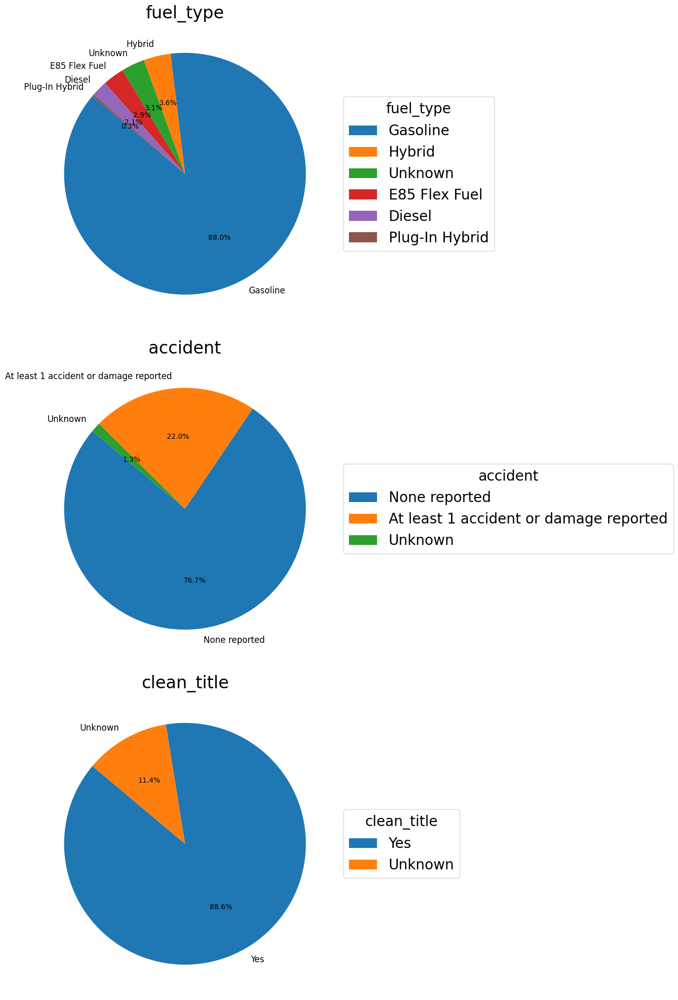

In [18]:
# Set up the figure and axes
fig, axs = plt.subplots(len(categorical), 1, figsize=(20, 20))


# Plot each categorical feature
for i, feature in enumerate(categorical):
    counts = X[feature].value_counts()
    wedges, texts, autotexts = axs[i].pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=140)
    
    # Create a legend
    axs[i].legend(wedges, counts.index, title=feature, loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))
    
    # Optional: format the text
    for text in texts:
        text.set_fontsize(12)
    for autotext in autotexts:
        autotext.set_fontsize(10)

    axs[i].set_title(f'{feature}')

# Adjust layout
plt.tight_layout()
plt.show()

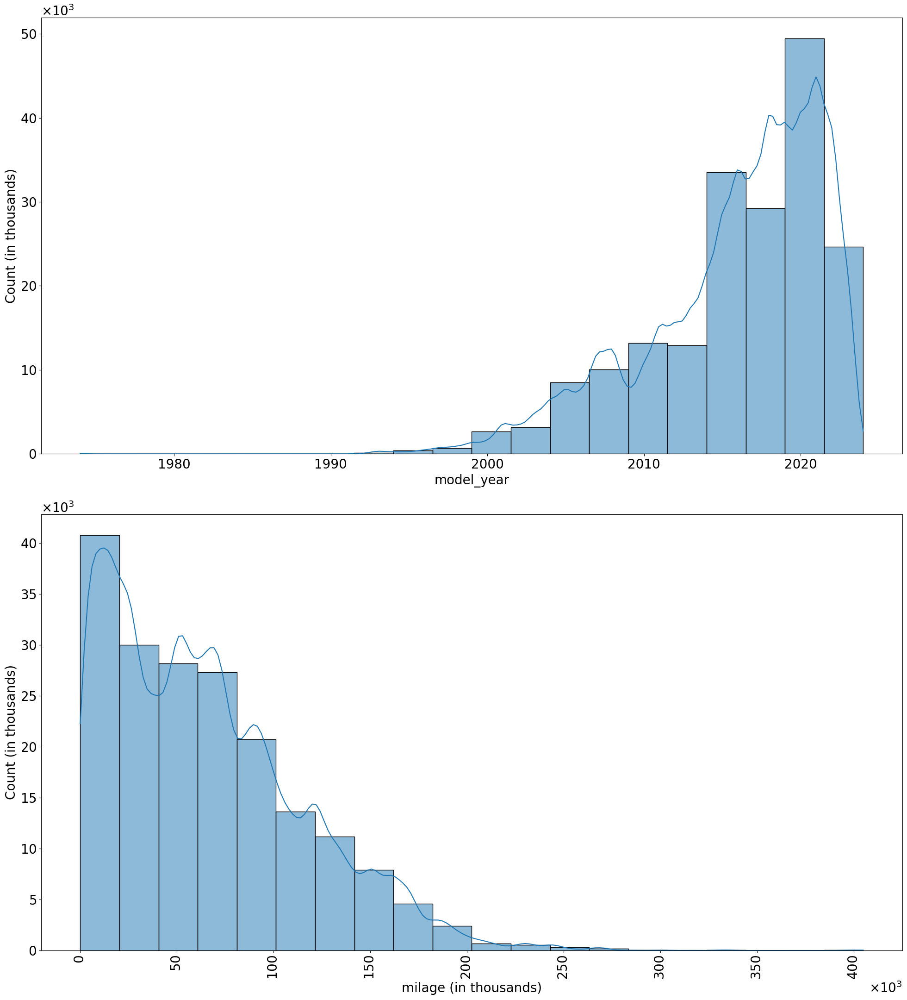

In [19]:
# Create a ScalarFormatter with scientific notation
formatter = ticker.ScalarFormatter(useMathText=True)
formatter.set_powerlimits((0, 0))  # Always show scientific notation

# Set up the fig and axs
fig, axs = plt.subplots(2, 1, figsize=(20, 22))

for i, feature in enumerate(continuous):
    ax = axs[i]
    
    # Plot the histogram
    sns.histplot(x=X[feature], ax=ax, bins=20, kde=True)
    plt.xticks(rotation=90)
    
    # Set the y-axis formatter
    ax.yaxis.set_major_formatter(formatter)
    ax.ticklabel_format(axis='y', style='sci', scilimits=(3, 3))
    ax.set_ylabel('Count (in thousands)')
    
    # Set the x-axis formatter for 'milage'
    if feature == 'milage':
        ax.xaxis.set_major_formatter(formatter)
        ax.ticklabel_format(axis='x', style='sci', scilimits=(3, 3))
        ax.set_xlabel('milage (in thousands)')
    
    # Remove offset text (x10^n)
    ax.ticklabel_format(useOffset=False)

# Optimize the layout
plt.tight_layout()
plt.show()

# Do not pay attention to the x10^3, couldn't find a way to remove them

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
from wordcloud import WordCloud

In [21]:
train = pd.read_csv('../input/playground-series-s4e9/train.csv')
test = pd.read_csv('../input/playground-series-s4e9/test.csv')
submission = pd.read_csv("../input/playground-series-s4e9/sample_submission.csv")

In [22]:
train.drop('id', axis = 1, inplace = True)
train.describe().T

,count,mean,std,min,25%,50%,75%,max
model_year,188533.0,2015.829998,5.660967,1974.0,2013.0,2017.0,2020.0,2024.0
milage,188533.0,65705.295174,49798.158076,100.0,24115.0,57785.0,95400.0,405000.0
price,188533.0,43878.016178,78819.522254,2000.0,17000.0,30825.0,49900.0,2954083.0


In [23]:
train.dtypes

brand           object
model           object
model_year       int64
milage           int64
fuel_type       object
engine          object
transmission    object
ext_col         object
int_col         object
accident        object
clean_title     object
price            int64
dtype: object

In [24]:
numerical_column_names = train.select_dtypes(include=['number']).columns
print("Numerical Column Names:", numerical_column_names.tolist())

Numerical Column Names: ['model_year', 'milage', 'price']


In [25]:
object_column_names = train.select_dtypes(include=['object']).columns
print("Object Column Names:", object_column_names.tolist())

Object Column Names: ['brand', 'model', 'fuel_type', 'engine', 'transmission', 'ext_col', 'int_col', 'accident', 'clean_title']


In [26]:
train.isnull().sum()

brand               0
model               0
model_year          0
milage              0
fuel_type        5083
engine              0
transmission        0
ext_col             0
int_col             0
accident         2452
clean_title     21419
price               0
dtype: int64

In [27]:
print("Duplicated Rows:",train.duplicated().sum())
print("Number of Rows:",train.shape[0])
print("Number of Columns:",train.shape[1])

Duplicated Rows: 0
Number of Rows: 188533
Number of Columns: 12


In [28]:
train.nunique()

brand             57
model           1897
model_year        34
milage          6651
fuel_type          7
engine          1117
transmission      52
ext_col          319
int_col          156
accident           2
clean_title        1
price           1569
dtype: int64

In [29]:
categorical_columns = ['brand', 'model', 'fuel_type', 'engine', 'transmission', 'ext_col', 'int_col', 'accident', 'clean_title']

In [30]:
for col in categorical_columns:
    
    print(f"Category in {col} is : {train[col].unique()}")
    print("<--- --- --- --- --- --- --- --- --- --->")

Category in brand is : ['MINI' 'Lincoln' 'Chevrolet' 'Genesis' 'Mercedes-Benz' 'Audi' 'Ford'
 'BMW' 'Tesla' 'Cadillac' 'Land' 'GMC' 'Toyota' 'Hyundai' 'Volvo'
 'Volkswagen' 'Buick' 'Rivian' 'RAM' 'Hummer' 'Alfa' 'INFINITI' 'Jeep'
 'Porsche' 'McLaren' 'Honda' 'Lexus' 'Dodge' 'Nissan' 'Jaguar' 'Acura'
 'Kia' 'Mitsubishi' 'Rolls-Royce' 'Maserati' 'Pontiac' 'Saturn' 'Bentley'
 'Mazda' 'Subaru' 'Ferrari' 'Aston' 'Lamborghini' 'Chrysler' 'Lucid'
 'Lotus' 'Scion' 'smart' 'Karma' 'Plymouth' 'Suzuki' 'FIAT' 'Saab'
 'Bugatti' 'Mercury' 'Polestar' 'Maybach']
<--- --- --- --- --- --- --- --- --- --->
Category in model is : ['Cooper S Base' 'LS V8' 'Silverado 2500 LT' ... 'e-Golf SE'
 'Integra w/A-Spec Tech Package' 'IONIQ Plug-In Hybrid SEL']
<--- --- --- --- --- --- --- --- --- --->
Category in fuel_type is : ['Gasoline' 'E85 Flex Fuel' nan 'Hybrid' 'Diesel' 'Plug-In Hybrid' '–'
 'not supported']
<--- --- --- --- --- --- --- --- --- --->
Category in engine is : ['172.0HP 1.6L 4 Cylinder Engine Ga

In [31]:
train['clean_title'] = train['clean_title'].fillna('No')
train['accident'] = train['accident'].fillna('None reported')

In [32]:
train.head()

,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,price
0,MINI,Cooper S Base,2007,213000,Gasoline,172.0HP 1.6L 4 Cylinder Engine Gasoline Fuel,A/T,Yellow,Gray,None reported,Yes,4200
1,Lincoln,LS V8,2002,143250,Gasoline,252.0HP 3.9L 8 Cylinder Engine Gasoline Fuel,A/T,Silver,Beige,At least 1 accident or damage reported,Yes,4999
2,Chevrolet,Silverado 2500 LT,2002,136731,E85 Flex Fuel,320.0HP 5.3L 8 Cylinder Engine Flex Fuel Capab...,A/T,Blue,Gray,None reported,Yes,13900
3,Genesis,G90 5.0 Ultimate,2017,19500,Gasoline,420.0HP 5.0L 8 Cylinder Engine Gasoline Fuel,Transmission w/Dual Shift Mode,Black,Black,None reported,Yes,45000
4,Mercedes-Benz,Metris Base,2021,7388,Gasoline,208.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,7-Speed A/T,Black,Beige,None reported,Yes,97500


In [33]:
print("Average Milage of the car:",train['milage'].mean().round(2))
print("Maximum Milage of the car:",train['milage'].max())
print("Minimum Milage of the car:",train['milage'].min())
print("Average Price of the car:",train['price'].mean().round(2))
print("Maximum Price of the car:",train['price'].max())
print("Minimum Price of the car:",train['price'].min())

Average Milage of the car: 65705.3
Maximum Milage of the car: 405000
Minimum Milage of the car: 100
Average Price of the car: 43878.02
Maximum Price of the car: 2954083
Minimum Price of the car: 2000


In [34]:
fig = px.scatter(train, x=train.index, y='price', title='Distribution of Prices', 
                 labels={'x': 'Index', 'price': 'Price'}
                )
fig.update_traces(marker=dict(size=10, color='blue', opacity=0.7))
fig.update_layout(xaxis_title='Index', yaxis_title='Price')
fig.show()

In [35]:
fig = px.scatter(train, x=train.index, y='milage', title='Distribution of Milage',
                 labels={'x': 'Index', 'price': 'Price'}
                )
fig.update_traces(marker=dict(size=10, color='blue', opacity=0.7))
fig.update_layout(xaxis_title='Index', yaxis_title='Price')
fig.show()

In [36]:
fig3 = px.scatter(train, x='milage', y='price', title='Milage vs Price',
                 labels={'milage': 'Milage', 'price': 'Price'})
fig3.update_traces(marker=dict(size=10, color='blue', opacity=0.7))
fig3.update_layout(xaxis_title='Milage', yaxis_title='Price')
fig3.show()

In [37]:
brand_counts = train['brand'].value_counts().reset_index().head(10)
brand_counts.columns = ['brand', 'count']

In [38]:
fig = px.bar(brand_counts, x='brand', y='count', 
             title='Top 10 Brand',
             labels={'brand': 'Brand', 'count': 'Count'},
             color='count',  
             color_continuous_scale='Viridis'  
)

fig.update_layout(
    xaxis_title='Brand',
    yaxis_title='Count',
    width=600,  
    height=600,
    plot_bgcolor='black',  
    paper_bgcolor='black',   
    font=dict(color='white'), 
    title_font=dict(color='white'),  
    xaxis=dict(tickfont=dict(color='white')),  
    yaxis=dict(tickfont=dict(color='white'))   
)

fig.show()

In [39]:
model_counts = train['model'].value_counts().reset_index().head(10)
model_counts.columns = ['model', 'count']

In [40]:
fig = px.bar(model_counts, x='model', y='count', 
             title='Top 10 Model',
             labels={'model': 'Model', 'count': 'Count'},
             color='count',  
             color_continuous_scale='Viridis'  
)

fig.update_layout(
    xaxis_title='Model',
    yaxis_title='Count',
    width=600,  
    height=600,
    plot_bgcolor='black',  
    paper_bgcolor='black',   
    font=dict(color='white'), 
    title_font=dict(color='white'),  
    xaxis=dict(tickfont=dict(color='white')),  
    yaxis=dict(tickfont=dict(color='white'))   
)

fig.show()

In [41]:
fuel_counts = train['fuel_type'].value_counts().reset_index()
fuel_counts.columns = ['fuel_type', 'count']

In [42]:
fig = px.bar(fuel_counts, x='fuel_type', y='count', 
             title='Distribution of Fuel Count',
             labels={'fuel_type': 'Fuel Type', 'count': 'Count'},
             color='count',  
             color_continuous_scale='Viridis'  
)

fig.update_layout(
    xaxis_title='Fuel Brand',
    yaxis_title='Count',
    width=600,  
    height=600,
    plot_bgcolor='black',  
    paper_bgcolor='black',   
    font=dict(color='white'), 
    title_font=dict(color='white'),  
    xaxis=dict(tickfont=dict(color='white')),  
    yaxis=dict(tickfont=dict(color='white'))  
)

fig.show()

In [43]:
transmission_counts = train['transmission'].value_counts().reset_index().head(10)
transmission_counts.columns = ['transmission', 'count']

In [44]:
fig = px.bar(transmission_counts, x='transmission', y='count', 
             title='Distribution of Transmission Type',
             labels={'transmission': 'Transmission Type', 'count': 'Count'},
             color='count', 
             color_continuous_scale='Viridis'  
)

fig.update_layout(
    xaxis_title='Transmission Type',
    yaxis_title='Count',
    width=600,  
    height=600,
    plot_bgcolor='black',  
    paper_bgcolor='black',   
    font=dict(color='white'), 
    title_font=dict(color='white'),  
    xaxis=dict(tickfont=dict(color='white')),  
    yaxis=dict(tickfont=dict(color='white'))  
)

fig.show()

In [45]:
int_col_counts = train['int_col'].value_counts().reset_index().head(10)
int_col_counts.columns = ['int_col', 'count']

In [46]:
fig = px.bar(int_col_counts, x='int_col', y='count', 
             title='Distribution of Interior Color Category',
             labels={'int_col': 'Color', 'count': 'Count'},
             color='count',  
             color_continuous_scale='Viridis'  
)

fig.update_layout(
    xaxis_title='Interior Color',
    yaxis_title='Count',
    width=600,  
    height=600,
    plot_bgcolor='black',  
    paper_bgcolor='black',   
    font=dict(color='white'), 
    title_font=dict(color='white'),  
    xaxis=dict(tickfont=dict(color='white')),  
    yaxis=dict(tickfont=dict(color='white'))
)

fig.show()

In [47]:
ext_col_counts = train['ext_col'].value_counts().reset_index().head(10)
ext_col_counts.columns = ['ext_col', 'count']

In [48]:
fig = px.bar(ext_col_counts, x='ext_col', y='count', 
             title='Distribution of Exterior Color Category',
             labels={'ext_col': 'Color', 'count': 'Count'},
             color='count',  
             color_continuous_scale='Viridis'  
)

fig.update_layout(
    xaxis_title='Exterior Color',
    yaxis_title='Count',
    width=600,  
    height=600,
    plot_bgcolor='black',  
    paper_bgcolor='black',   
    font=dict(color='white'), 
    title_font=dict(color='white'),  
    xaxis=dict(tickfont=dict(color='white')),  
    yaxis=dict(tickfont=dict(color='white'))
)

fig.show()

In [49]:
accident_counts = train['accident'].value_counts().reset_index()
accident_counts.columns = ['accident', 'count']

In [50]:
fig = px.pie(accident_counts, names='accident', values='count',
             title='Distribution of Accident Reports',
             color='count'
)

fig.update_layout(
    width=700,  
    height=700,
    legend_title='Accident Type'  
)

fig.show()

In [51]:
cleantitle_counts = train['clean_title'].value_counts().reset_index()
cleantitle_counts.columns = ['clean_title', 'count']

In [52]:
fig = px.pie(cleantitle_counts, names='clean_title', values='count',
             title='Distribution of Clean Title',
             color='count'
)

fig.update_layout(
    width = 500,  
    height = 500,
    legend_title='clean_title'  
)

fig.show()

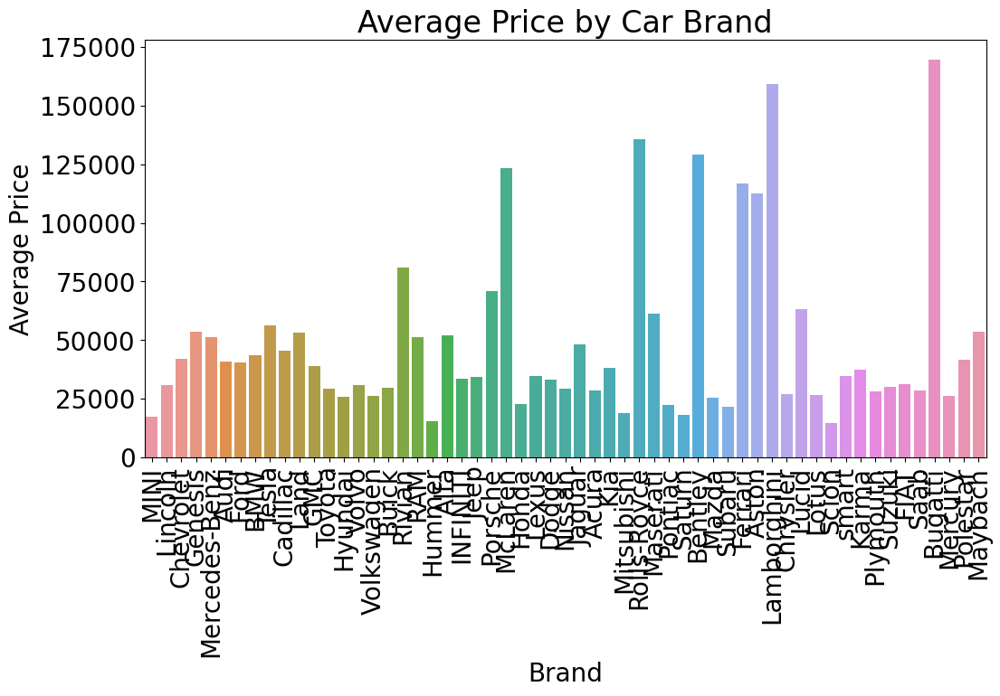

In [53]:
plt.figure(figsize=(12, 6))
sns.barplot(x='brand', y='price', data=train, errorbar=None)
plt.title('Average Price by Car Brand')
plt.xlabel('Brand')
plt.ylabel('Average Price')
plt.xticks(rotation=90)  
plt.show()

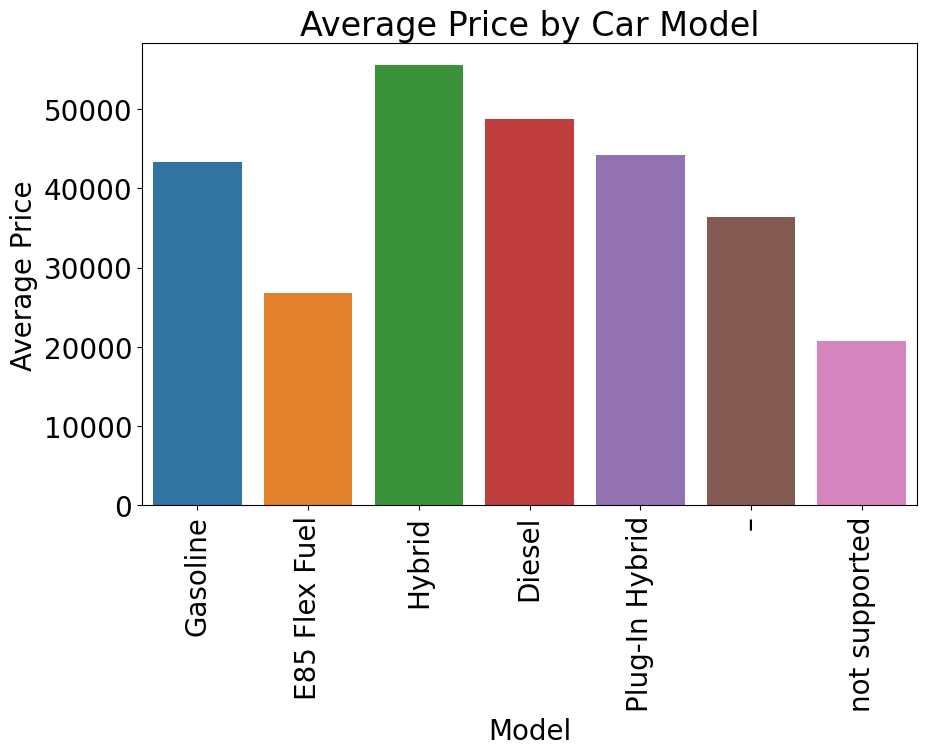

In [54]:
plt.figure(figsize=(10, 6))
sns.barplot(x='fuel_type', y='price', data=train, errorbar=None)
plt.title('Average Price by Car Model')
plt.xlabel('Model')
plt.ylabel('Average Price')
plt.xticks(rotation=90)  
plt.show()

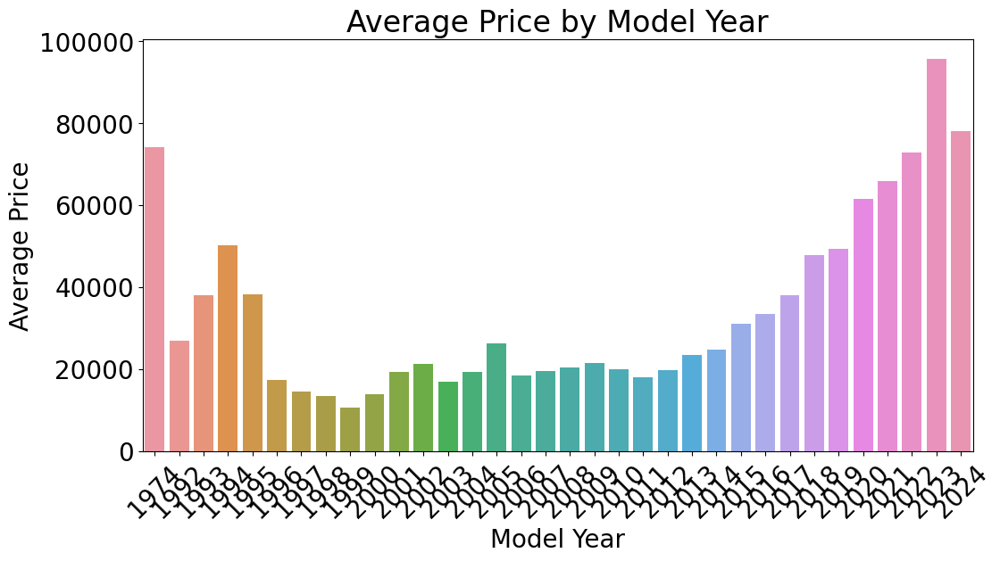

In [55]:
plt.figure(figsize=(12, 6))
sns.barplot(x='model_year', y='price', data=train, errorbar=None)
plt.title('Average Price by Model Year')
plt.xlabel('Model Year')
plt.ylabel('Average Price')
plt.xticks(rotation=45)
plt.show()

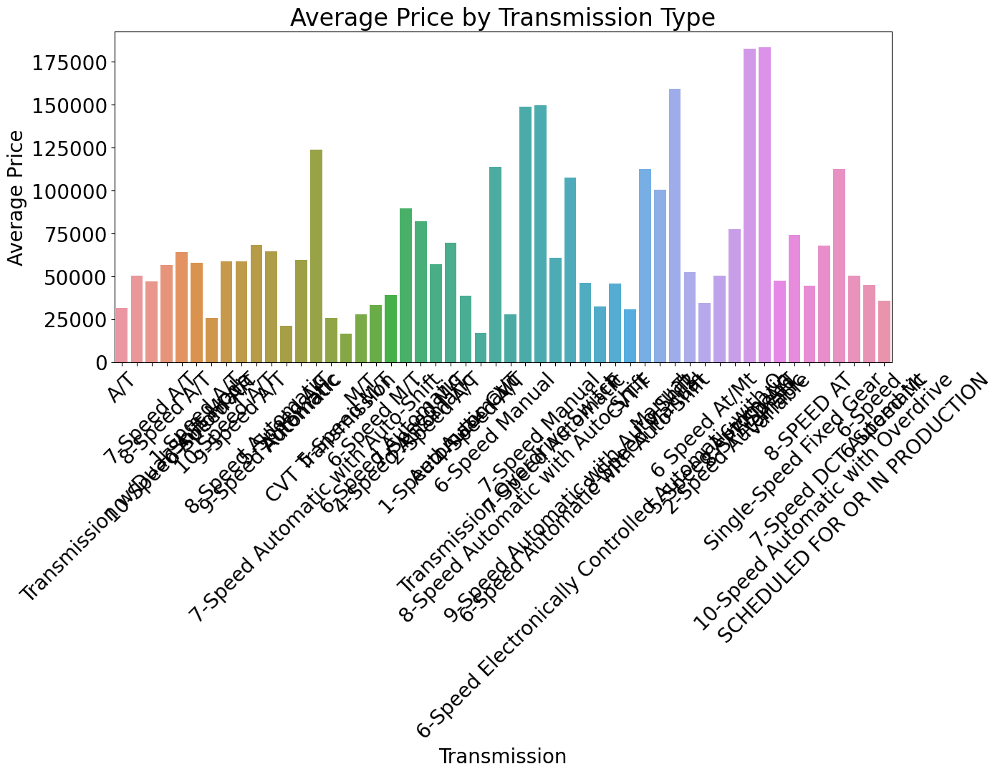

In [56]:
plt.figure(figsize=(14, 6))
sns.barplot(x='transmission', y='price', data=train, errorbar=None)
plt.title('Average Price by Transmission Type')
plt.xlabel('Transmission')
plt.ylabel('Average Price')
plt.xticks(rotation=45)
plt.show()

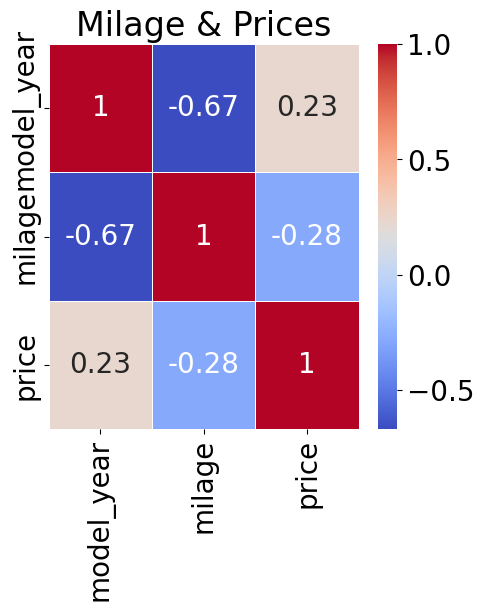

In [57]:
milage_price = ['model_year','milage', 'price']

corr_matrix = train[milage_price].corr()

plt.figure(figsize=(5,5))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Milage & Prices')
plt.show()

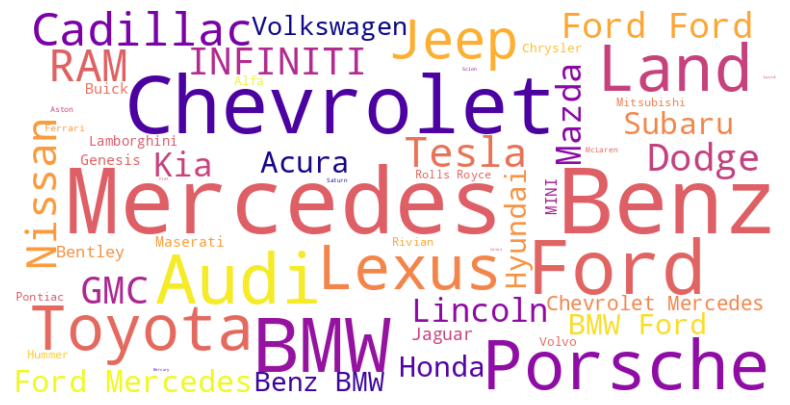

In [58]:
brand_text = ' '.join(train['brand'])

wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='plasma').generate(brand_text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  
plt.show()

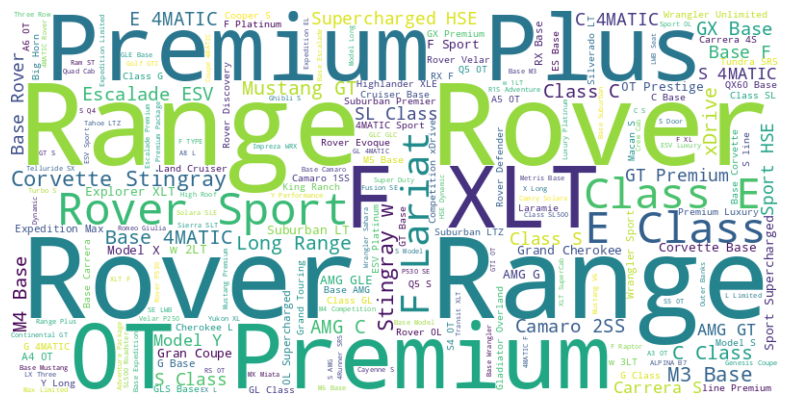

In [59]:
model_text = ' '.join(train['model'])

wordcloud = WordCloud(width=800, height=400, background_color='white',colormap='viridis').generate(model_text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  
plt.show()

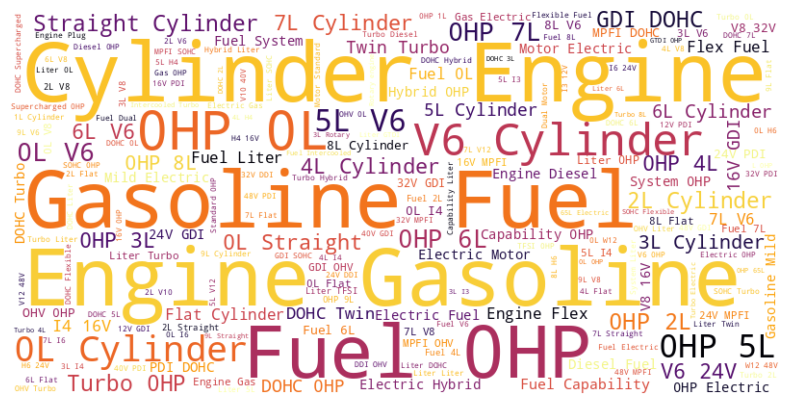

In [60]:
engine_text = ' '.join(train['engine'])

wordcloud = WordCloud(width=800, height=400, background_color='white',colormap='inferno').generate(engine_text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  
plt.show()

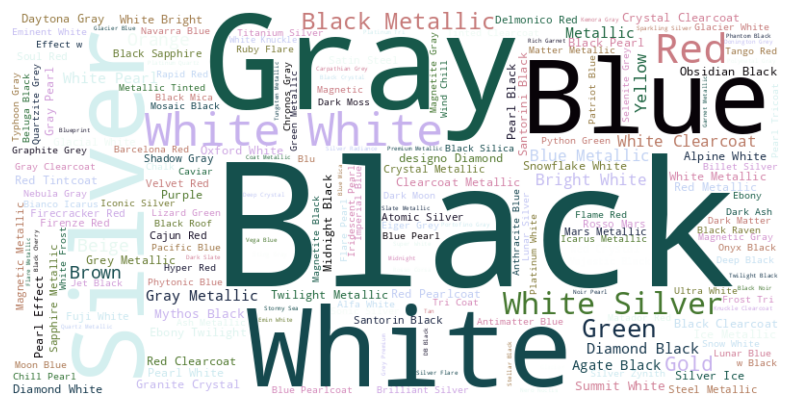

In [61]:
extclr_text = ' '.join(train['ext_col'])

wordcloud = WordCloud(width=800, height=400, background_color='white',colormap='cubehelix').generate(extclr_text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  
plt.show()

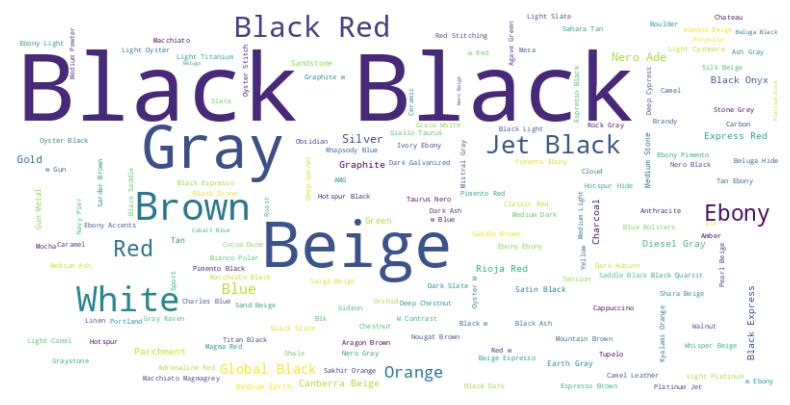

In [62]:
intclr_text = ' '.join(train['int_col'])

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(intclr_text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  
plt.show()

# Model 1

In [63]:
#df1 = pd.read_csv('/kaggle/input/automl-gp5-lightautoml-oofs-and-test-preds/PRED_LightAutoMLTestersModels.csv')[["id","BLEND"]]
#df2 = pd.read_csv("/kaggle/input/s4e9-submission1/robert_output_050924.csv")
#df3 = pd.read_csv("/kaggle/input/s4e9-submission1/samira_output_050924.csv")
#df4 = pd.read_csv("/kaggle/input/s4e9-submission1/sheikh_output_050924.csv")
#df5 = pd.read_csv('/kaggle/input/s4e9-submission1/pradipta_output_050924.csv')
#df6 = pd.read_csv('/kaggle/input/s4e9-submission1/arya_output_050924.csv')
#df7 = pd.read_csv('/kaggle/input/s4e9-submission1/rebecca_output_020924.csv')
#df8 = pd.read_csv('/kaggle/input/s4e9-submission1/submission(7).csv')
#df9 = pd.read_csv('/kaggle/input/s4e9-submission1/ravi_output_050924.csv')
#df1 = df1.rename(columns={'BLEND':'price'})

In [64]:
#weights = [0.39,0.255, 0.080, 0.13, 0.050, 0.08, 0.01, 0.02]
#dfs = [df1, df2, df3, df4, df5, df6, df7,df8]

#df1['price'] = sum(weight * df['price'] for weight, df in zip(weights, dfs))

In [65]:
#df1.to_csv('./submission.csv',index=False)

# Model 2

In [66]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import re

import lightgbm as lgb
from lightgbm import log_evaluation, early_stopping
from catboost import CatBoostRegressor, Pool

from sklearn.svm import SVR
from xgboost import XGBRegressor



import random

from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold

import optuna

USE_OPTUNA = False

In [67]:
#!python /kaggle/usr/lib/lgbm_cat/lgbm_cat.py

In [68]:
sub_1 = pd.read_csv("/kaggle/input/privatesp/submission_sp.csv")

In [69]:
sub_2 = pd.read_csv("/kaggle/input/price-cars-prediction-eda-blending/submission.csv")

In [70]:
%%time

sample_sub = pd.read_csv('/kaggle/input/playground-series-s4e9/sample_submission.csv')
train = pd.read_csv('/kaggle/input/playground-series-s4e9/train.csv')
test = pd.read_csv('/kaggle/input/playground-series-s4e9/test.csv')
Original = pd.read_csv('/kaggle/input/used-car-price-prediction-dataset/used_cars.csv')

train.drop(columns=['id'], inplace=True)
test.drop(columns=['id'], inplace=True)

Original[['milage', 'price']] = Original[['milage', 'price']].map(
    lambda x: int(''.join(re.findall(r'\d+', x))))

train = pd.concat([train, Original], ignore_index=True)

CPU times: user 867 ms, sys: 46.2 ms, total: 913 ms
Wall time: 933 ms


In [71]:
def extract_age_features(df):
    current_year = 2024

    df['Vehicle_Age'] = current_year - df['model_year']
    
    df['Mileage_per_Year'] = df['milage'] / df['Vehicle_Age']
    df['milage_with_age'] =  df.groupby('Vehicle_Age')['milage'].transform('mean')
    
    df['Mileage_per_Year_with_age'] =  df.groupby('Vehicle_Age')['Mileage_per_Year'].transform('mean')
 
#     df['milage_brand'] =  df.groupby('brand')['milage'].transform('mean')
    
    
    return df

In [72]:
def extract_engine_features(df):
    
    def extract_horsepower(engine):
        try:
            return float(engine.split('HP')[0])
        except:
            return None

    def extract_engine_size(engine):
        try:
            return float(engine.split(' ')[1].replace('L', ''))
        except:
            return None

    df['Horsepower'] = df['engine'].apply(extract_horsepower)
    df['Engine_Size'] = df['engine'].apply(extract_engine_size)
    df['Power_to_Weight_Ratio'] = df['Horsepower'] / df['Engine_Size']
    
    return df

In [73]:
def extract_other_features(df):
    
    luxury_brands =  ['Mercedes-Benz', 'BMW', 'Audi', 'Porsche', 'Land', 
                    'Lexus', 'Jaguar', 'Bentley', 'Maserati', 'Lamborghini', 
                    'Rolls-Royce', 'Ferrari', 'McLaren', 'Aston', 'Maybach']
    df['Is_Luxury_Brand'] = df['brand'].apply(lambda x: 1 if x in luxury_brands else 0)
    
#     df['luxary_with_accident'] = df.apply(lambda row: 1 if row['Is_Luxury_Brand'] == 1  and row['accident'] == 'At least 1 accident or damage reported' else 0  ,  axis =1)
    
#     df.drop(columns = ['Is_Luxury_Brand'] , inplace=True)



    return df

In [74]:
%%time

train = extract_age_features(train)
test = extract_age_features(test)

# train = extract_engine_features(train)
# test = extract_engine_features(test)

train = extract_other_features(train)
test = extract_other_features(test)

CPU times: user 256 ms, sys: 7.89 ms, total: 264 ms
Wall time: 265 ms


In [75]:
train.head()

,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,price,Vehicle_Age,Mileage_per_Year,milage_with_age,Mileage_per_Year_with_age,Is_Luxury_Brand
0,MINI,Cooper S Base,2007,213000,Gasoline,172.0HP 1.6L 4 Cylinder Engine Gasoline Fuel,A/T,Yellow,Gray,None reported,Yes,4200,17,12529.411765,118194.992360,6952.646609,0
1,Lincoln,LS V8,2002,143250,Gasoline,252.0HP 3.9L 8 Cylinder Engine Gasoline Fuel,A/T,Silver,Beige,At least 1 accident or damage reported,Yes,4999,22,6511.363636,118270.783105,5375.944687,0
2,Chevrolet,Silverado 2500 LT,2002,136731,E85 Flex Fuel,320.0HP 5.3L 8 Cylinder Engine Flex Fuel Capab...,A/T,Blue,Gray,None reported,Yes,13900,22,6215.045455,118270.783105,5375.944687,0
3,Genesis,G90 5.0 Ultimate,2017,19500,Gasoline,420.0HP 5.0L 8 Cylinder Engine Gasoline Fuel,Transmission w/Dual Shift Mode,Black,Black,None reported,Yes,45000,7,2785.714286,67981.161419,9711.594488,0
4,Mercedes-Benz,Metris Base,2021,7388,Gasoline,208.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,7-Speed A/T,Black,Beige,None reported,Yes,97500,3,2462.666667,29327.437406,9775.812469,1


In [76]:
def update(df):
    
    t = 100
    
    cat_c = ['brand','model','fuel_type','engine','transmission','ext_col','int_col','accident','clean_title',
             
            ]
    re_ = ['model','engine','transmission','ext_col','int_col']
    
    for col in re_:
        df.loc[df[col].value_counts(dropna=False)[df[col]].values < t, col] = "noise"
        
    for col in cat_c:
        df[col] = df[col].fillna('missing')
        df[col] = df[col].astype('category')
        
    return df

train  = update(train)
test   = update(test)

X = train.drop('price', axis=1)
y = train['price']

In [77]:
import numpy as np
import lightgbm as lgb
from catboost import CatBoostRegressor, Pool
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold



callbacks = [log_evaluation(period=300), early_stopping(stopping_rounds=200)]

cat_cols = train.select_dtypes(include=['object', 'category']).columns.tolist()

print(f"cat_cols--------{cat_cols}")


def get_MAE_oof(df, target, lgb_params, cat_params=None, model_type='LGBM'):

    
    oof_predictions = np.zeros(len(df))
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    models = []
    rmse_scores = []
    
    for fold, (train_idx, val_idx) in enumerate(kf.split(df)):
        print(f"Training fold {fold + 1}/{5} with {model_type}")

        X_train, X_val = df.iloc[train_idx], df.iloc[val_idx]
        y_train, y_val = target.iloc[train_idx], target.iloc[val_idx]

        if model_type == 'LGBM':
            train_data = lgb.Dataset(X_train, label=y_train)
            val_data = lgb.Dataset(X_val, label=y_val, reference=train_data)
            
            model = lgb.train(
                lgb_params,
                train_data,
                valid_sets=[train_data, val_data],
                valid_names=['train', 'valid'],
                callbacks=callbacks    
            )
        
        elif model_type == 'CAT':
            train_data = Pool(data=X_train, label=y_train , cat_features=cat_cols)
            val_data = Pool(data=X_val, label=y_val , cat_features=cat_cols )
            
            model = CatBoostRegressor(**cat_params)
            model.fit(train_data, eval_set=val_data, verbose=150, early_stopping_rounds=200)
        
        models.append(model)
        
        if model_type == 'LGBM':
            pred = model.predict(X_val, num_iteration=model.best_iteration)
        elif model_type == 'CAT':
            pred = model.predict(X_val)
        
        rmse = np.sqrt(mean_squared_error(y_val, pred))
        rmse_scores.append(rmse)

        print(f'{model_type} Fold RMSE: {rmse}')
        
        oof_predictions[val_idx] = pred
        
    print(f'Mean RMSE: {np.mean(rmse_scores)}')
    return oof_predictions, models




lgb_params = {
    'objective': 'MAE',
    'n_estimators': 1000,
    'random_state': 42,
}

oof_predictions_lgbm, models_lgbm = get_MAE_oof(X, y, lgb_params, model_type='LGBM')
X['LGBM_MAE'] = oof_predictions_lgbm


LGBM_preds = np.zeros(len(test))
for model in models_lgbm:
    LGBM_preds += model.predict(test) / len(models_lgbm)
test['LGBM_MAE'] = LGBM_preds



lgb_params = {
    'objective': 'MSE',
    'n_estimators': 1000,
    'random_state': 42,
}

oof_predictions_lgbm, models_lgbm = get_MAE_oof(X, y, lgb_params, model_type='LGBM')

X['LGBM_MSE_diff'] = oof_predictions_lgbm - X['LGBM_MAE']


LGBM_preds = np.zeros(len(test))
for model in models_lgbm:
    LGBM_preds += model.predict(test) / len(models_lgbm)
test['LGBM_MSE_diff'] = LGBM_preds - test['LGBM_MAE']

cat_cols--------['brand', 'model', 'fuel_type', 'engine', 'transmission', 'ext_col', 'int_col', 'accident', 'clean_title']
Training fold 1/5 with LGBM
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1724
[LightGBM] [Info] Number of data points in the train set: 154033, number of used features: 16
[LightGBM] [Info] Start training from score 30775.000000
Training until validation scores don't improve for 200 rounds
[300]	train's l1: 16276	valid's l1: 17275.2
[600]	train's l1: 16059.5	valid's l1: 17275.1
Early stopping, best iteration is:
[521]	train's l1: 16108.6	valid's l1: 17271.6
LGBM Fold RMSE: 76012.31926267133
Trai

In [78]:
def objective_lgb(trial):   
    lgb_params = {
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
        'max_depth': trial.suggest_int('max_depth', 5, 50),
        'reg_alpha': trial.suggest_loguniform('reg_alpha', 1e-4, 1.0),
        'reg_lambda': trial.suggest_loguniform('reg_lambda', 1e-4, 10.0),
        'num_leaves': trial.suggest_int('num_leaves', 20, 150),
        'subsample': trial.suggest_uniform('subsample', 0.2, 1.0),
        'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.2, 1.0),
        'n_estimators': 1000,
        'random_state': 42
    }

    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    rmse_scores = []

    for train_index, val_index in kf.split(X):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]

        train_data = lgb.Dataset(X_train, label=y_train)
        val_data = lgb.Dataset(X_val, label=y_val, reference=train_data)

        model = lgb.train(lgb_params, 
                          train_data, 
                          valid_sets=[val_data], 
                          callbacks=callbacks
                         )

        y_pred = model.predict(X_val)
        rmse = np.sqrt(mean_squared_error(y_val, y_pred))
        rmse_scores.append(rmse)

    return np.mean(rmse_scores)

def objective_cat(trial):

    cat_params = {
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
        'depth': trial.suggest_int('depth', 5, 16),
        'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-4, 10.0),
        'iterations': 1000,
        'random_strength': trial.suggest_int('random_strength', 0, 100),
        'cat_features': cat_cols,
        'random_seed': 42,
        'task_type': 'GPU',
        'early_stopping_rounds': 200
    }

    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    rmse_scores_cat = []

    for train_index, val_index in kf.split(X):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        
        train_pool = Pool(X_train, y_train, cat_features=cat_cols)
        val_pool = Pool(X_val, y_val, cat_features=cat_cols)
        
        model_cat = CatBoostRegressor(**cat_params)
        model_cat.fit(train_pool, eval_set=val_pool, verbose=300)
        
        y_pred_cat = model_cat.predict(X_val)
        rmse_cat = np.sqrt(mean_squared_error(y_val, y_pred_cat))
        rmse_scores_cat.append(rmse_cat)
    
    return np.mean(rmse_scores_cat)

if USE_OPTUNA==True:
    study_lgb = optuna.create_study(direction='minimize')
    study_lgb.optimize(objective_lgb, n_trials=20)

    print("Best LGBM Parameters: ", study_lgb.best_params)
    print("Best LGBM RMSE: ", study_lgb.best_value)

    study_cat = optuna.create_study(direction='minimize')
    study_cat.optimize(objective_cat, n_trials=2)

    print("Best CatBoost Parameters: ", study_cat.best_params)
    print("Best CatBoost RMSE: ", study_cat.best_value)

In [79]:
lgb_params_1 = {
    'learning_rate': 0.007,  # Biraz daha düşük öğrenme hızı
    'max_depth': 48,  # Derinliği hafif azalt
    'reg_alpha': 0.04,  # Hafif artırılmış düzenleme
    'reg_lambda': 9.7,  # Orta düzeyde düzenleme
    'num_leaves': 150,  # Yaprak sayısını dengede tut
    'subsample': 0.33,  # Orta düzeyde örnekleme
    'colsample_bytree': 0.47,  # Özellik örnekleme dengesi
    'n_estimators': 1700,  # Daha fazla iterasyon
    'random_state': 42,
    'extra_tree': False,
    'verbose': -1
}

lgb_params_2 = {
    'learning_rate': 0.013,  # Biraz daha yüksek öğrenme hızı
    'max_depth': 42,  # Derinliği biraz azalt
    'reg_alpha': 0.03,  # Daha düşük düzenleme
    'reg_lambda': 8.8,  # Lambda'yı biraz daha düşür
    'num_leaves': 120,  # Yaprak sayısını azalt
    'subsample': 0.27,  # Örnekleme oranını hafif azalt
    'colsample_bytree': 0.43,  # Özellik örnekleme dengesi
    'n_estimators': 1300,  # Daha az iterasyon
    'random_state': 42,
    'verbose': -1
}



cat_params = {
    'learning_rate': 0.025,  # Daha düşük öğrenme hızı
    'iterations': 1500,  # Daha makul iterasyon
    'depth': 9,  # Derinliği dengede tut
    'random_strength': 4,  # Daha düşük rastgelelik
    'cat_features': cat_cols,  # Kategorik özellikler
    'l2_leaf_reg': 0.30,  # L2 düzenlemeyi biraz azalt
    'random_seed': 42,
    'early_stopping_rounds': 350,  # Erken durdurma süresi
    'task_type': 'GPU',  # GPU kullanarak hızlandır
}







kf = KFold(n_splits=5, shuffle=True, random_state=42)

rmse_scores = []
rmse_scores_cat = []
LGBM_model=[]
CAT_model =[]

callbacks = [log_evaluation(period=150), early_stopping(stopping_rounds=200)]

for train_index, val_index in kf.split(X):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]
    

    
    train_data = lgb.Dataset(X_train, label=y_train)
    val_data = lgb.Dataset(X_val, label=y_val, reference=train_data)
    
    model_1 = lgb.train(lgb_params_1,
                      train_data,
                      valid_sets=[train_data, val_data],
                      valid_names=['train', 'valid'],
                      callbacks=callbacks        
                      )
    model_2 = lgb.train(lgb_params_2,
                  train_data,
                  valid_sets=[train_data, val_data],
                  valid_names=['train', 'valid'],
                  callbacks=callbacks        
                  )
    
    LGBM_model.append(model_1)
    LGBM_model.append(model_2)

    y_pred = model_1.predict(X_val) * 0.5 + model_2.predict(X_val) * 0.5
    

    rmse = np.sqrt(mean_squared_error(y_val, y_pred))
    rmse_scores.append(rmse)
    
    print(f'LGBM Fold RMSE: {rmse}')
    
    
    model_cat = CatBoostRegressor(**cat_params)
    

    train_pool = Pool(X_train, y_train ,cat_features=cat_cols)
    val_pool = Pool(X_val, y_val , cat_features=cat_cols)
    model_cat.fit(train_pool, eval_set=val_pool, verbose=300)
    
    CAT_model.append(model_cat)
    y_pred_cat = model_cat.predict(X_val)
    rmse_cat = np.sqrt(mean_squared_error(y_val, y_pred_cat))
    rmse_scores_cat.append(rmse_cat)
    
    print(f'CAT Fold RMSE: {rmse_cat}')


print(f'Mean LGBM RMSE: {np.mean(rmse_scores)}')
print(f'Mean CAT RMSE: {np.mean(rmse_scores_cat)}')

Training until validation scores don't improve for 200 rounds
[150]	train's l2: 4.97887e+09	valid's l2: 5.755e+09
[300]	train's l2: 4.5523e+09	valid's l2: 5.63696e+09
[450]	train's l2: 4.26917e+09	valid's l2: 5.62506e+09
[600]	train's l2: 4.03874e+09	valid's l2: 5.6282e+09
Early stopping, best iteration is:
[471]	train's l2: 4.23591e+09	valid's l2: 5.62392e+09
Training until validation scores don't improve for 200 rounds
[150]	train's l2: 4.6472e+09	valid's l2: 5.64536e+09
[300]	train's l2: 4.1845e+09	valid's l2: 5.62394e+09
[450]	train's l2: 3.84559e+09	valid's l2: 5.63933e+09
Early stopping, best iteration is:
[253]	train's l2: 4.30967e+09	valid's l2: 5.62392e+09
LGBM Fold RMSE: 74984.1367483124
0:	learn: 77963.5254613	test: 80694.7234308	best: 80694.7234308 (0)	total: 6.12s	remaining: 2h 32m 48s
300:	learn: 68286.4668148	test: 75127.9651221	best: 75127.9651221 (300)	total: 17s	remaining: 1m 7s
600:	learn: 65127.7389956	test: 75193.1064812	best: 75115.5628535 (364)	total: 27.7s	remai

In [80]:
LGBM_preds = np.zeros(len(test))
for model in LGBM_model:
    LGBM_preds += model.predict(test) / len(LGBM_model)

In [81]:
CAT_preds = np.zeros(len(test))
for model in CAT_model:
    CAT_preds += model.predict(test) / len(CAT_model)

In [82]:
test_preds = LGBM_preds * 0.8 + CAT_preds * 0.2

In [83]:
sample_sub['price'] = (0.9 * test_preds + 0.1 * sub_1['price']) * 0.4 + 0.6 * sub_2['price']
sample_sub.to_csv("submission.csv", index=False)
sample_sub.head()

,id,price
0,188533,18503.751405
1,188534,80254.309368
2,188535,57688.735127
3,188536,29654.522376
4,188537,31031.903768


In [84]:
feature_names = X.columns


lgb_importances = np.zeros(len(feature_names))

for model in LGBM_model:
    lgb_importances += model.feature_importance(importance_type='split') / len(LGBM_model)

lgb_feature_importance = pd.DataFrame({'Feature': feature_names, 'Importance': lgb_importances})
lgb_feature_importance.sort_values(by='Importance', ascending=False, inplace=True)


print(lgb_feature_importance)

                      Feature  Importance
3                      milage      7016.4
17              LGBM_MSE_diff      6575.6
16                   LGBM_MAE      6036.3
12           Mileage_per_Year      5975.4
5                      engine      3859.8
1                       model      3690.8
2                  model_year      3226.6
11                Vehicle_Age      2079.3
6                transmission      2068.2
0                       brand      1947.1
14  Mileage_per_Year_with_age      1941.9
7                     ext_col      1869.4
13            milage_with_age      1753.0
8                     int_col      1328.2
9                    accident       462.2
15            Is_Luxury_Brand       328.1
10                clean_title       322.0
4                   fuel_type       112.8


In [85]:
feature_names = X.columns
cat_importances = np.zeros(len(feature_names))

for model in CAT_model:
 
    cat_importances += model.get_feature_importance(type='FeatureImportance') / len(CAT_model)

cat_feature_importance = pd.DataFrame({'Feature': feature_names, 'Importance': cat_importances})
cat_feature_importance.sort_values(by='Importance', ascending=False, inplace=True)


print(cat_feature_importance)

                      Feature  Importance
16                   LGBM_MAE   19.762646
17              LGBM_MSE_diff    9.289667
0                       brand    8.404396
6                transmission    7.256946
8                     int_col    7.051969
7                     ext_col    7.006612
3                      milage    6.654552
12           Mileage_per_Year    5.780070
5                      engine    4.623167
13            milage_with_age    4.203838
1                       model    3.947269
4                   fuel_type    3.220093
9                    accident    3.109124
14  Mileage_per_Year_with_age    2.789086
11                Vehicle_Age    2.406783
15            Is_Luxury_Brand    1.590210
10                clean_title    1.569851
2                  model_year    1.333720


(array([6.4138e+04, 3.9924e+04, 1.5369e+04, 4.1780e+03, 1.2070e+03,
        4.8500e+02, 2.6100e+02, 1.1100e+02, 1.5000e+01, 2.0000e+00]),
 array([  8319.42727336,  39123.35007471,  69927.27287605, 100731.1956774 ,
        131535.11847875, 162339.04128009, 193142.96408144, 223946.88688279,
        254750.80968414, 285554.73248548, 316358.65528683]),
 <BarContainer object of 10 artists>)

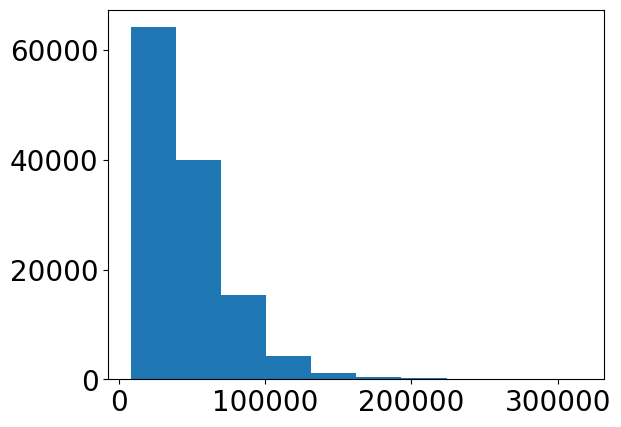

In [86]:
plt.hist(sample_sub['price'])